In [1]:
import os,csv,torch,numpy,scipy.io,PIL.Image,torchvision.transforms

from mit_semseg.models import ModelBuilder,SegmentationModule
from mit_semseg.utils import colorEncode

In [2]:
colors = scipy.io.loadmat('data/color150.mat')['colors']
names = {}
with open(r'data/object150_info.csv') as f :
    reader = csv.reader(f)
    next(reader)
    for row in reader:
        names[int(row[0])] = row[5].split(";")[0]

In [3]:
def visualize_result(img,pred,index = None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f"{names[index+1]}:")

    # colorize prediction
    pred_color = colorEncode(pred,colors).astype(numpy.uint8)

    # aggregate images and save
    im_vis = numpy.concatenate((img,pred_color),axis = 1 )
    display(PIL.Image.fromarray(im_vis))

In [4]:
# Network Builders
net_encoder = ModelBuilder.build_encoder(
    arch='resnet50dilated',
    fc_dim=2048,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/encoder_epoch_20.pth')
net_decoder = ModelBuilder.build_decoder(
    arch='ppm_deepsup',
    fc_dim=2048,
    num_class=150,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/decoder_epoch_20.pth',
    use_softmax=True)

Loading weights for net_encoder
Loading weights for net_decoder


In [5]:
crit = torch.nn.NLLLoss(ignore_index=-1)
segmentation_module = SegmentationModule(net_encoder,net_decoder,crit)
segmentation_module.eval()

SegmentationModule(
  (encoder): ResnetDilated(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): SynchronizedBatchNorm2d(128, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): SynchronizedBatchNorm2d(64, eps=1

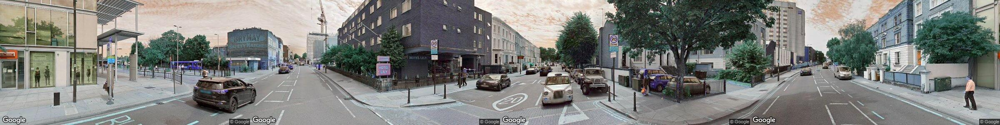

In [6]:
# Load and normalize one image as a singleton tensor batch
pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])
pil_image = PIL.Image.open(r'./images/8pcguVQpxRMikWptAhcM8w.jpg').convert("RGB")
pil_image

In [7]:
img_original = numpy.array(pil_image)
img_data = pil_to_tensor(pil_image)
singleton_batch = {'img_data':img_data[None]}
output_size = img_data.shape[1:]

In [8]:
# Run the segmentation at the highest resolution.
with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)
# Get the predicted scores for each pixel
_, pred = torch.max(scores, dim=1)
pred = pred.cpu()[0].numpy()
# visualize_result(img_original, pred,index=2)

In [12]:
pred

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [6, 6, 6, ..., 6, 6, 6],
       [6, 6, 6, ..., 6, 6, 6],
       [6, 6, 6, ..., 6, 6, 6]], dtype=int64)

building:


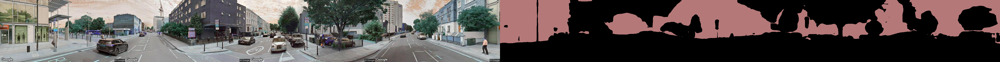

In [9]:
visualize_result(img_original, pred, index=1)

tree:


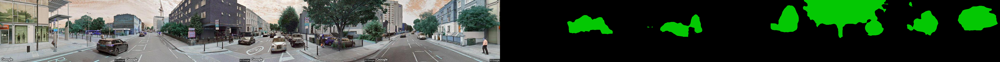

In [31]:
visualize_result(img_original, pred, index=4)

building:


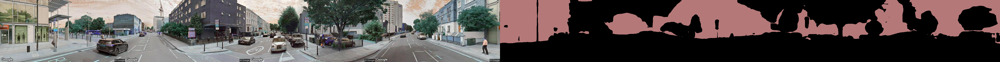

In [19]:
visualize_result(img_original, pred, index=1)

wall:


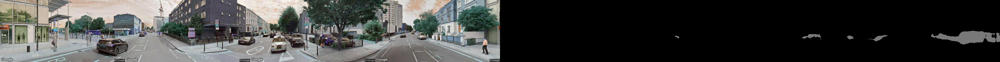

In [18]:
visualize_result(img_original, pred, index=0)

In [39]:
len(pred[pred == 11])

96220

In [43]:
len(pred.flatten())

720000

In [24]:
pred

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [6, 6, 6, ..., 6, 6, 6],
       [6, 6, 6, ..., 6, 6, 6],
       [6, 6, 6, ..., 6, 6, 6]], dtype=int64)

In [37]:
len(pred[numpy.isin(pred, [1,2])])

282848

In [43]:
pred[numpy.isin(pred, [1])]

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)